<a href="https://colab.research.google.com/github/shrutisaumya05/Image-Segmentation-using-CNN/blob/main/EDA03_04_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install xarray netcdf4

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 28.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 27.1 MB/s eta 0:00:00


In [ ]:
import xarray as xr
import glob
import os
import requests
from bs4 import BeautifulSoup

# Corrected URL containing the directory with NetCDF files
url = "https://portal.nersc.gov/project/ClimateNet/climatenet_new/train/"

# Get HTML content from the URL
response = requests.get(url)
if response.status_code == 200:
    soup = BeautifulSoup(response.content, 'html.parser')

    # Find all 'a' tags (links) in the HTML content
    links = soup.find_all('a')

    # Filter out links ending with '.nc' (NetCDF files)
    file_links = [link.get('href') for link in links if link.get('href').endswith('.nc')]

    # Download each NetCDF file
    for file_link in file_links:
        filename = os.path.basename(file_link)
        with open(filename, 'wb') as f:
            f.write(requests.get(url + file_link).content)

# Get a list of all downloaded NetCDF files
file_list = glob.glob('*.nc')

# Read all NetCDF files into a single Dataset
ds = xr.open_mfdataset(file_list, combine='by_coords')

# Inspect the dataset
print(ds)


<xarray.Dataset>
Dimensions:  (lat: 768, lon: 1152, time: 188)
Coordinates:
  * lat      (lat) float64 -90.0 -89.77 -89.53 -89.3 ... 89.3 89.53 89.77 90.0
  * lon      (lon) float64 0.0 0.3125 0.625 0.9375 ... 358.8 359.1 359.4 359.7
  * time     (time) object 'data-1996-06-09-01-1.nc' ... 'data-2010-10-29-01-...
Data variables: (12/17)
    TMQ      (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    U850     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    V850     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    UBOT     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    VBOT     (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    QREFHT   (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>
    ...       ...
    TS       (time, lat, lon) float32 dask.array<chunksize=(1, 768, 1152), meta=np.ndarray>

In [ ]:
ds.info()

xarray.Dataset {
dimensions:
	lat = 768 ;
	lon = 1152 ;
	time = 188 ;

variables:
	float64 lat(lat) ;
	float64 lon(lon) ;
	float32 TMQ(time, lat, lon) ;
		TMQ:description = total (vertically integrated) precipitable water ;
		TMQ:units =  kg/m^2 ;
	float32 U850(time, lat, lon) ;
		U850:description = zonal wind at 850 mbar pressure surface ;
		U850:units = m/s ;
	float32 V850(time, lat, lon) ;
		V850:description = meridional wind at 850 mbar pressure surface ;
		V850:units = m/s ;
	float32 UBOT(time, lat, lon) ;
		UBOT:description = lowest level zonal wind ;
		UBOT:units = m/s ;
	float32 VBOT(time, lat, lon) ;
		VBOT:description = lowest model level meridional wind ;
		VBOT:units = m/s ;
	float32 QREFHT(time, lat, lon) ;
		QREFHT:description = reference height humidity ;
		QREFHT:units = kg/kg ;
	float32 PS(time, lat, lon) ;
		PS:description = surface pressure ;
		PS:units = Pa ;
	float32 PSL(time, lat, lon) ;
		PSL:description = sea level pressure ;
		PSL:units = Pa ;
	float32 T200(tim

In [ ]:
import xarray as xr
import pandas as pd

min_lat, max_lat = 17, 22
min_lon, max_lon = 81, 87

# Select data within the specified region
region_data = ds.sel(lat=slice(min_lat, max_lat), lon=slice(min_lon, max_lon))

# Convert the selected data to a pandas DataFrame
df = region_data.to_dataframe()
df.sample(5)

,,,TMQ,U850,V850,UBOT,VBOT,QREFHT,PS,PSL,T200,T500,PRECT,TS,TREFHT,Z1000,Z200,ZBOT,LABELS
lat,lon,time,,,,,,,,,,,,,,,,,
18.422425,81.8750,data-2004-08-19-01-1.nc,41.839298,0.043734,-4.922972,2.347393,1.662999,0.016178,97352.132812,101353.960938,216.878845,266.389313,1.943141e-17,299.511108,298.873352,413.064209,12377.238281,65.865616,0
21.707953,84.6875,data-2001-10-20-01-1.nc,33.854065,-3.465002,-1.895069,-0.915589,0.007825,0.015622,97865.328125,101612.296875,218.648743,266.840576,8.602440e-16,298.179565,298.541992,389.945618,12378.659180,65.904747,0
19.126467,81.2500,data-2009-08-31-01-1.nc,47.336918,-4.734206,-0.264735,-1.871999,0.359363,0.016547,95776.507812,100534.453125,220.590149,269.095947,1.191127e-13,299.910248,298.307068,482.963409,12458.889648,65.699753,0
20.534550,86.2500,data-1996-09-01-01-1.nc,50.385853,6.668149,-2.199621,2.796162,1.841524,0.019932,100411.906250,100772.867188,221.119995,267.823517,7.969957e-10,301.701904,300.410583,97.346031,12433.827148,66.342545,0
21.707953,85.0000,data-2001-12-07-01-1.nc,10.258636,1.053944,-0.131952,-0.973473,-0.186247,0.005659,97236.226562,101650.085938,217.722473,264.187561,0.000000e+00,291.834015,290.988861,441.228302,12321.749023,63.734062,0


In [ ]:
df.shape

(78584, 17)

In [ ]:
# EDA
# numerical data
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

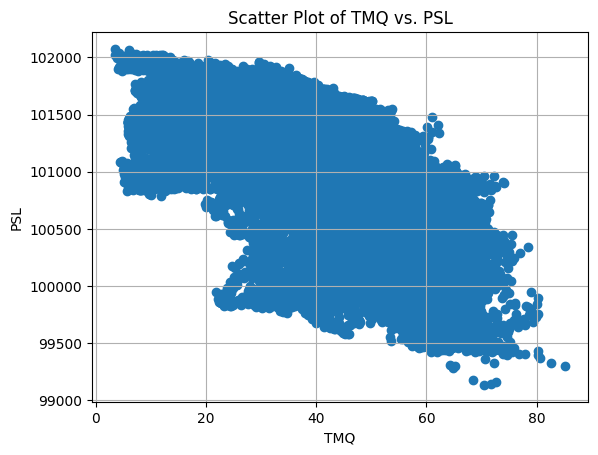

In [ ]:
import matplotlib.pyplot as plt



plt.scatter(df['TMQ'], df['PSL'])
plt.xlabel('TMQ')  # Label for x-axis
plt.ylabel('PSL')  # Label for y-axis
plt.title('Scatter Plot of TMQ vs. PSL')  # Title of the plot
plt.grid(True)  # Add grid lines
plt.show()


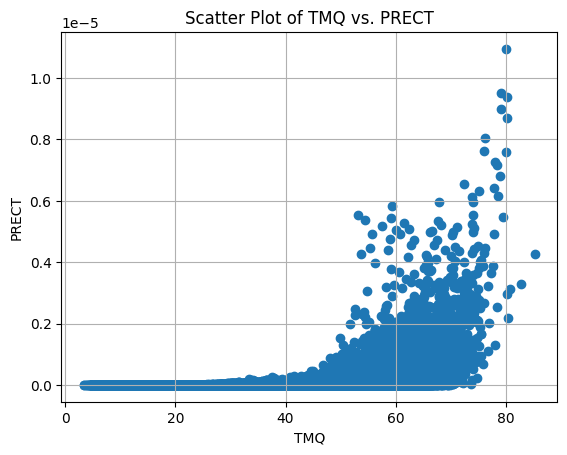

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'df' is your pandas DataFrame containing the data
# Replace 'TMQ' and 'PSL' with your actual column names if different

plt.scatter(df['TMQ'], df['PRECT'])
plt.xlabel('TMQ')  # Label for x-axis
plt.ylabel('PRECT')  # Label for y-axis
plt.title('Scatter Plot of TMQ vs. PRECT')  # Title of the plot
plt.grid(True)  # Add grid lines
plt.show()

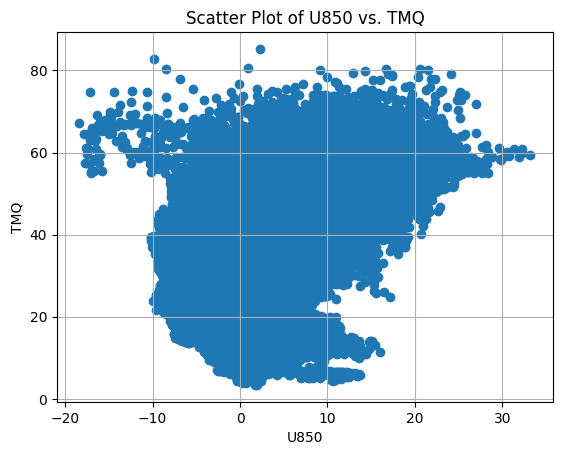

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'df' is your pandas DataFrame containing the data
# Replace 'TMQ' and 'PSL' with your actual column names if different

plt.scatter(df['U850'], df['TMQ'])
plt.xlabel('U850')  # Label for x-axis
plt.ylabel('TMQ')  # Label for y-axis
plt.title('Scatter Plot of U850 vs. TMQ')  # Title of the plot
plt.grid(True)  # Add grid lines
plt.show()

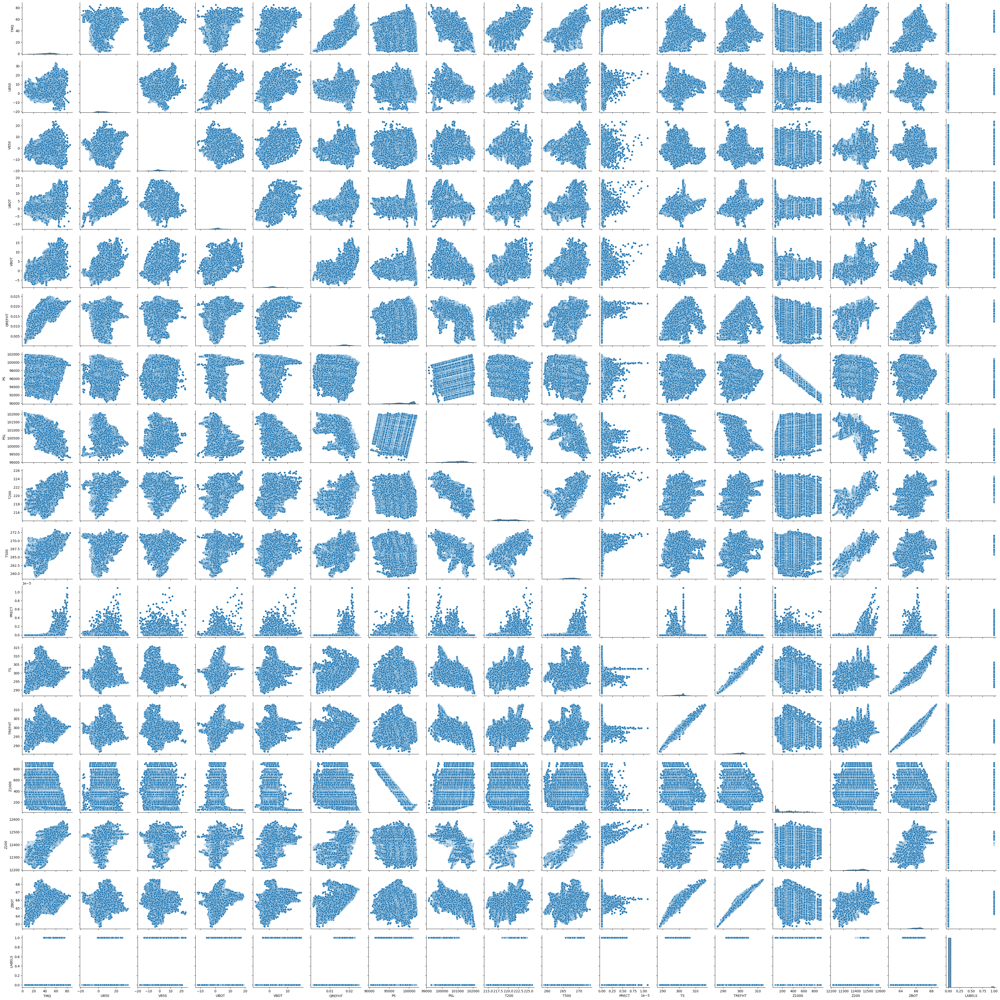

In [ ]:
import seaborn as sns
sns.pairplot(df)

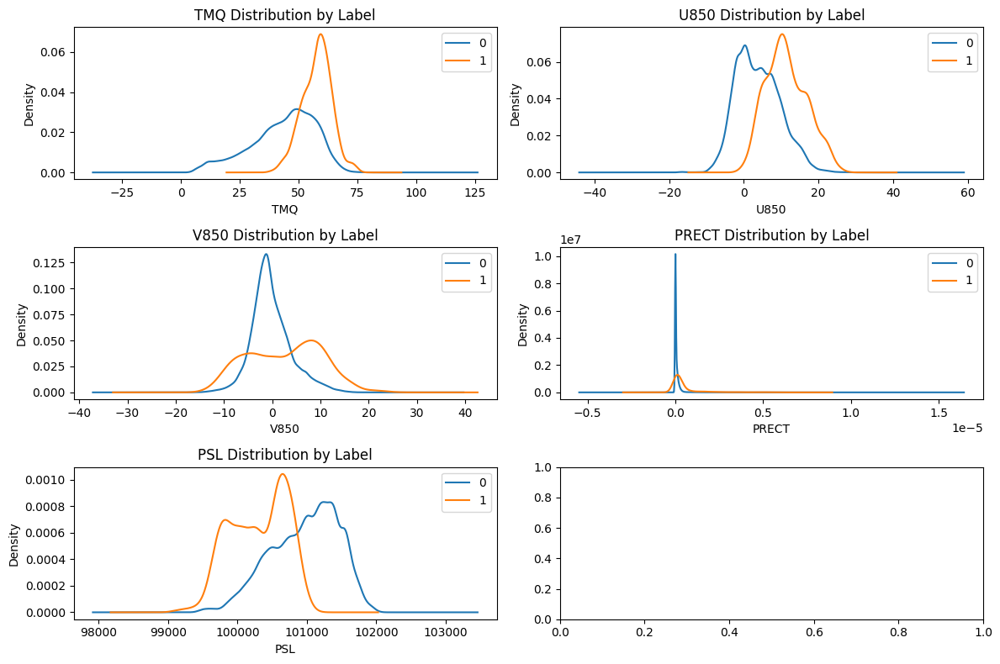

In [ ]:
# List of features to plot
features = ['TMQ', 'U850', 'V850', 'PRECT','PSL']

# Set up subplots
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 8))

# Flatten axes for easy iteration
axes = axes.flatten()

# Iterate over features and plot against the label column
for i, feature in enumerate(features):
    ax = axes[i]
    for label, group in df.groupby('LABELS'):
        group[feature].plot(kind='density', ax=ax, label=label)
    ax.set_title(f'{feature} Distribution by Label')
    ax.legend()
    ax.set_xlabel(feature)
    ax.set_ylabel('Density')

# Adjust layout
plt.tight_layout()
plt.show()


<ipython-input-10-e5a7bf605db9>:10: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


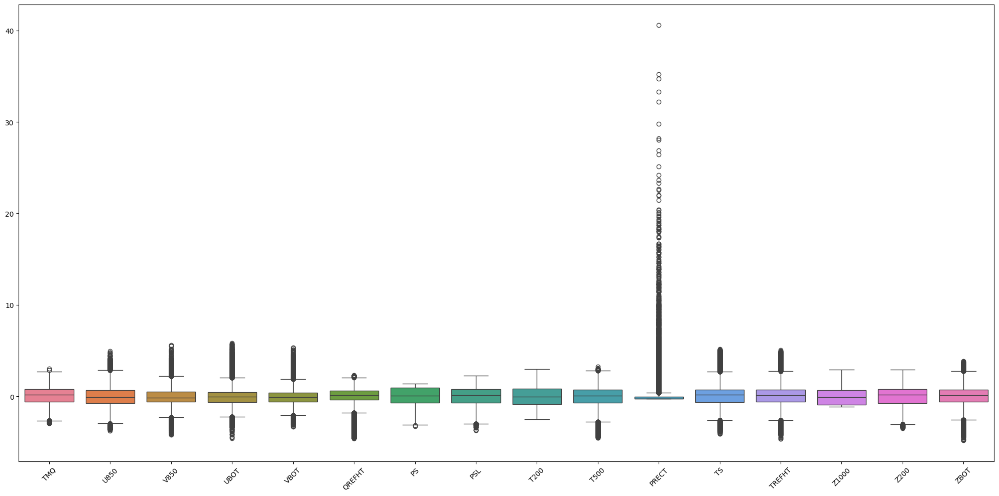

In [ ]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt


scaler = StandardScaler()
df_standardized = scaler.fit_transform(df)
df_standardized = pd.DataFrame(df_standardized, columns=df.columns)
plt.figure(figsize=(20,10))
ax = sns.boxplot(data=df_standardized.iloc[:,:16])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()

<ipython-input-11-fae490e97f7e>:8: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45)


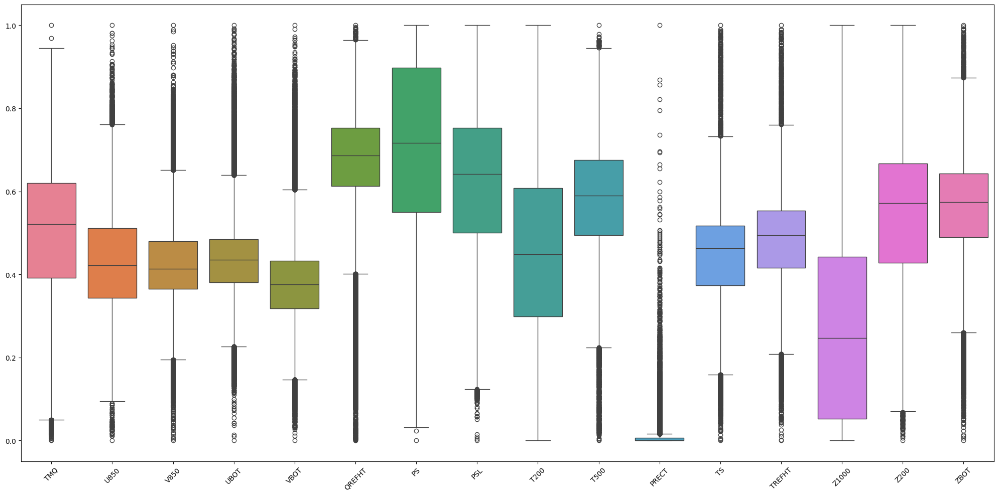

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler1 = MinMaxScaler()
df_standardized1 = scaler1.fit_transform(df)
df_standardized1= pd.DataFrame(df_standardized1, columns=df.columns)
plt.figure(figsize=(20,10))
ax = sns.boxplot(data=df_standardized1.iloc[:,:16])
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
plt.tight_layout()
plt.show()

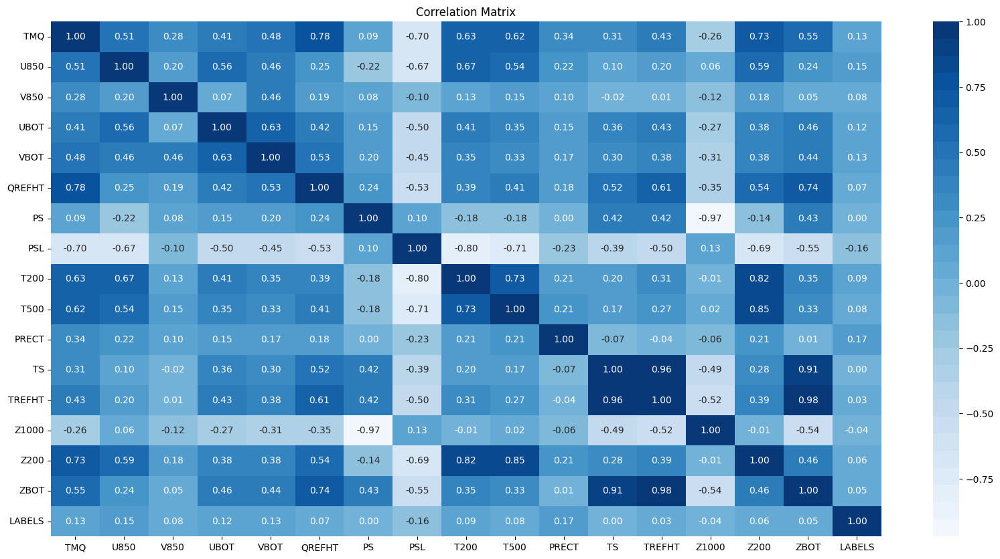

In [ ]:
plt.figure(figsize=(20,10))
blue_palette = sns.color_palette("Blues", 30)
sns.heatmap(df.corr(),annot=True,cmap=blue_palette,fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [ ]:
#PCA for the 16 variables
from sklearn.decomposition import PCA
pca= PCA(n_components=3)

In [ ]:
df_standardized_PCA= pca.fit_transform(df_standardized.iloc[:,:16])


In [ ]:
df_standardized_PCA.shape

(78584, 3)

In [ ]:
df_standardized_PCA

array([[ 0.80972574,  0.85813681, -0.80078038],
       [ 0.54612682, -0.23213545, -0.18972048],
       [ 0.1005967 ,  0.89765519,  0.13331234],
       ...,
       [-1.58357608, -2.37285376, -0.0461973 ],
       [-2.55359772, -2.25558464, -0.91085923],
       [-1.50643209, -2.04312208,  0.12872537]])

In [ ]:
import plotly.express as px
import plotly.graph_objects as go

# Assuming df_standardized_PCA has at least 3 columns for the first 3 principal components
x = df_standardized_PCA[:, 0]
y = df_standardized_PCA[:, 1]
z = df_standardized_PCA[:, 2]


label_column = df['LABELS']

# Create a 3D scatter plot
fig = px.scatter_3d(x=x, y=y, z=z, color=label_column,
                    color_discrete_sequence=px.colors.qualitative.G10,
                    labels={'color': 'Labels'})

fig.show()


In [ ]:
pca.explained_variance_

array([6.80124667, 3.16903832, 1.46958283])

In [ ]:
import numpy as np

# Assuming pca_model is your fitted PCA model
# Assuming df_standardized_PCA has been computed using PCA

# Get the principal components (eigenvectors) from the PCA model
principal_components = pca.components_

# Calculate the absolute values of the loadings for each feature in each PC
loadings = np.abs(principal_components)

# Get the names of the original features
feature_names = df.columns[:16]

# Create a dictionary to store the loading values for each feature
loading_values = {feature: loadings[:, i] for i, feature in enumerate(feature_names)}

# Print the loading values for each feature in each PC
for feature, values in loading_values.items():
    print(f"Feature: {feature}")
    for i, pc in enumerate(values):
        print(f"PC-{i+1}: {pc}")



Feature: Variable
PC-1: 0.31671203039981954
PC-2: 0.09692075873957395
PC-3: 0.12061536500476605
Feature: P-Value
PC-1: 0.23841079184834268
PC-2: 0.2783581739605514
PC-3: 0.06634182120325705


In [ ]:
import numpy as np

loadings = np.abs(principal_components)
feature_names = df.columns[:16]

# Create a dictionary to store the loading values for each feature
loading_values = {feature: loadings[:, i] for i, feature in enumerate(feature_names)}

# Print the loading values for each feature in each PC
for feature, values in loading_values.items():
    print(f"Feature: {feature}")
    for i, pc in enumerate(values):
        print(f"PC-{i+1}: {pc:.4f}")  # Round to 4 decimal places for better readability


Feature: Variable
PC-1: 0.3167
PC-2: 0.0969
PC-3: 0.1206
Feature: P-Value
PC-1: 0.2384
PC-2: 0.2784
PC-3: 0.0663


In [ ]:
df.head()

TMQ       U850       V850  \
lat       lon   time                                                       
17.014342 81.25 data-1996-06-09-01-1.nc  56.342190  13.036339 -10.293732   
                data-1996-07-11-01-1.nc  54.572144   6.471002  -4.286693   
                data-1996-07-18-01-1.nc  56.386250   8.983348  -3.408289   
                data-1996-09-01-01-1.nc  49.161888   1.671357  -1.645652   
                data-1996-09-12-01-1.nc  47.865036   0.990558  -2.492369   

                                             UBOT      VBOT    QREFHT  \
lat       lon   time                                                    
17.014342 81.25 data-1996-06-09-01-1.nc  5.163282  1.757134  0.014044   
                data-1996-07-11-01-1.nc  0.751915  2.730992  0.018259   
                data-1996-07-18-01-1.nc  3.335202 -0.492403  0.017492   
                data-1996-09-01-01-1.nc -0.064215  2.706687  0.019010   
                data-1996-09-12-01-1.nc -0.372562  2.532423  0.018988   

                                                   PS            PSL  \
lat       lon   time                                                   
17.014342 81.25 data-1996-06-09-01-1.nc  99267.078125  100622.320312   
                data-1996-07-11-01-1.nc  99228.250000  100583.687500   
                data-1996-07-18-01-1.nc  98984.671875  100341.890625   
                data-1996-09-01-01-1.nc  99663.593750  101026.070312   
                data-1996-09-12-01-1.nc  99696.109375  101057.148438   

                                               T200        T500         PRECT  \
lat       lon   time                                                            
17.014342 81.25 data-1996-06-09-01-1.nc  221.407074  267.710724 -2.512136e-23   
                data-1996-07-11-01-1.nc  219.473907  267.540283  3.002336e-08   
                data-1996-07-18-01-1.nc  219.912170  267.923157  5.138599e-13   
                data-1996-09-01-01-1.nc  219.870575  266.537476  3.122263e-09   
                data-1996-09-12-01-1.nc  219.010010  267.386353  3.159062e-08   

                                                 TS      TREFHT       Z1000  \
lat       lon   time                                                          
17.014342 81.25 data-1996-06-09-01-1.nc  297.925079  298.589691  182.938248   
                data-1996-07-11-01-1.nc  299.875214  299.240509  183.057129   
                data-1996-07-18-01-1.nc  297.163300  296.923767  182.543884   
                data-1996-09-01-01-1.nc  299.967285  298.881561  182.983505   
                data-1996-09-12-01-1.nc  300.852051  299.742218  183.164413   

                                                 Z200       ZBOT  LABELS  
lat       lon   time                                                      
17.014342 81.25 data-1996-06-09-01-1.nc  12431.243164  65.922676       0  
                data-1996-07-11-01-1.nc  12394.581055  66.041550       0  
                data-1996-07-18-01-1.nc  12387.177734  65.528305       0  
                data-1996-09-01-01-1.nc  12406.737305  65.967918       0  
                data-1996-09-12-01-1.nc  12419.861328  66.148827       0

In [ ]:
import pandas as pd

from scipy.stats import f_oneway
import matplotlib.pyplot as plt


# Assuming 'df' is your pandas DataFrame containing the data
target_variable = 'LABELS'

# Separate predictor variables and target variable
predictor_variables = df.drop(columns=[target_variable])
target_variable_values = df[target_variable]

# Perform ANOVA test for each continuous variable
continuous_variables = predictor_variables.select_dtypes(include='number').columns
anova_p_values = {}
for variable in continuous_variables:
    groups = [data[1] for data in df.groupby(target_variable)[variable]]
    _, p_value = f_oneway(*groups)
    anova_p_values[variable] = p_value

# Combine p-values from both tests
all_p_values = anova_p_values

# Select top 4 variables with smallest p-values
top_5_variables = sorted(all_p_values, key=all_p_values.get)[:5]

# Create a table of variables along with p-values and their relationship with the target variable
table_data = {
    'Variable': top_5_variables,
    'P-Value': [all_p_values[var] for var in top_5_variables]
}
table_df = pd.DataFrame(table_data)

# Print the table
print("Top 5 variables with their P-Values:")
table_df



Top 5 variables with their P-Values:


,Variable,P-Value
0,U850,0.000000e+00
1,PSL,0.000000e+00
2,PRECT,0.000000e+00
3,VBOT,4.957244e-313
4,TMQ,3.758636e-271


<ipython-input-83-b4d814fc4072>:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




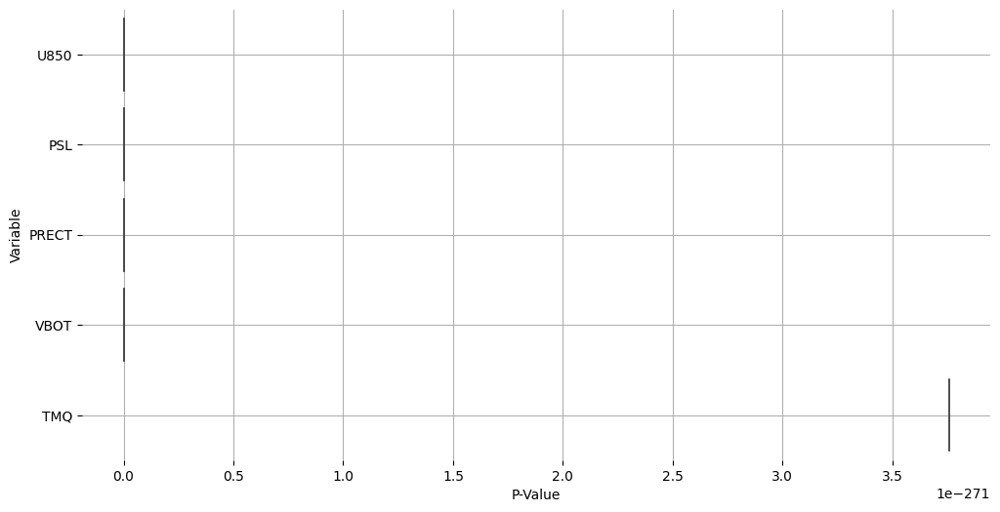

In [ ]:
# @title Variable vs P-Value

from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(table_df['Variable'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(table_df, x='P-Value', y='Variable', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)
plt.grid()
plt.show()

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:396: RuntimeWarning:

divide by zero encountered in log10



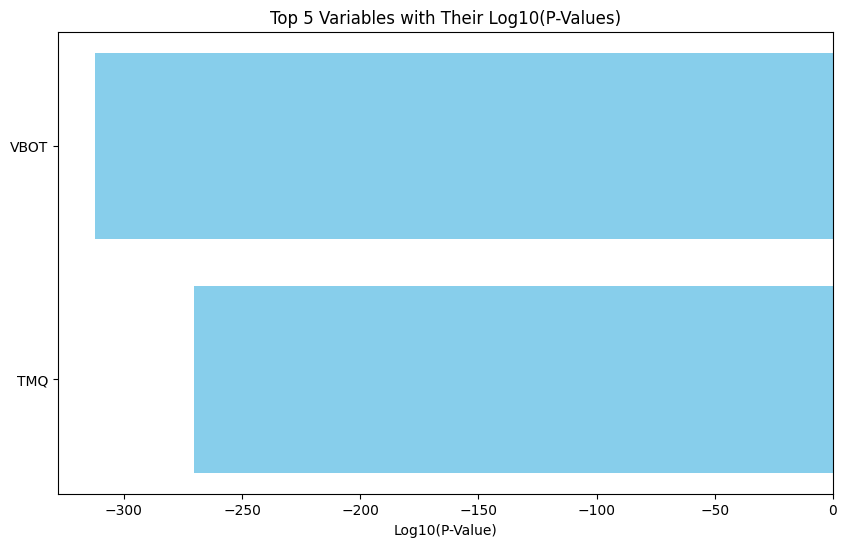

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Data
data = {
    'Variable': ['U850', 'PSL', 'PRECT', 'VBOT', 'TMQ'],
    'P-Value': [0.000000e+00, 0.000000e+00, 0.000000e+00, 4.957244e-313, 3.758636e-271]
}

# Create DataFrame
df = pd.DataFrame(data)

# Plot
plt.figure(figsize=(10, 6))
plt.barh(df['Variable'], np.log10(df['P-Value']), color='skyblue')  # Using log10 scale
plt.xlabel('Log10(P-Value)')
plt.title('Top 5 Variables with Their Log10(P-Values)')
plt.gca().invert_yaxis()  # Invert y-axis to have the variable with smallest p-value at the top
plt.show()
